### PyAlex library installation

In [ ]:
!pip install pyalex

### Adjacency Matrix Generation

In [ ]:
import pandas as pd
import pyalex
from pyalex import config, Works
import time
from tqdm import tqdm
import numpy as np
import networkx as nx

# PyAlex Configuration
pyalex.config.email = "your_email@email.com"
config.max_retries = 3
config.retry_backoff_factor = 0.5
config.retry_http_codes = [429, 500, 503]

# Load the table with the articles' information
file_path = "filename.csv"
article_survey = pd.read_csv(file_path)

# Dictionary to store article IDs and avoid repetitive calls
doi_to_id = {}

# List of DOIs present in the research
dois = article_survey["doi"].dropna().tolist()

# Preload article IDs to avoid multiple API calls
print("Fetching article IDs...")
for doi in tqdm(dois):
    try:
        article = Works()[doi]
        if article and 'id' in article:
            doi_to_id[doi] = article['id']
        else:
            print(f"DOI not found: {doi}")
    except Exception as e:
        print(f"Error getting ID for DOI {doi}: {e}")
    time.sleep(0.2)  # Small delay to avoid rate limit

# Create a dictionary to store connections between articles
adj_matrix = pd.DataFrame(0, index=dois, columns=dois)

print("\nAnalyzing citations between articles and filling in the adjacency matrix...")
for doi in tqdm(dois):
    try:
        if doi not in doi_to_id:
            print(f"DOI not found in presearch: {doi}")
            continue  # If we didn't find the ID before, we skip it.

        article = Works()[doi]
        if not article or 'referenced_works' not in article:
            continue

        cited_articles_id = set(article['referenced_works'])

        # Check which research articles were cited
        for cited_doi, cited_id in doi_to_id.items():
            if cited_id in cited_articles_id:
                adj_matrix.loc[doi, cited_doi] = 1  # Mark the quote in the matrix

    except Exception as e:
        print(f"Error processing DOI {doi}: {e}")
    time.sleep(0.2)  # Delay to avoid API blocking

# Save the adjacency matrix to a CSV file
output_file = "matriz_adjacencia.csv"
adj_matrix.to_csv(output_file)

print(f"\nProcessing completed. The adjacency matrix has been saved to '{output_file}'.")

Buscando IDs dos artigos...


100%|██████████| 125/125 [01:19<00:00,  1.57it/s]



Analisando citações entre os artigos e preenchendo a matriz de adjacência...


100%|██████████| 125/125 [01:01<00:00,  2.04it/s]


Processamento concluído. A matriz de adjacência foi salva em 'matriz_adjacencia.csv'.


### Graph Generation

<ipython-input-4-6bd5144ea143>:117: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches.Ellipse((x, y), width=largura, height=altura, color=cor_no, edgecolor="black", lw=6, zorder=3))
<ipython-input-4-6bd5144ea143>:115: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  shape = (patches.Rectangle((x - largura / 2, y - altura / 2), largura, altura, color=cor_no, edgecolor="black", lw=6, zorder=3)


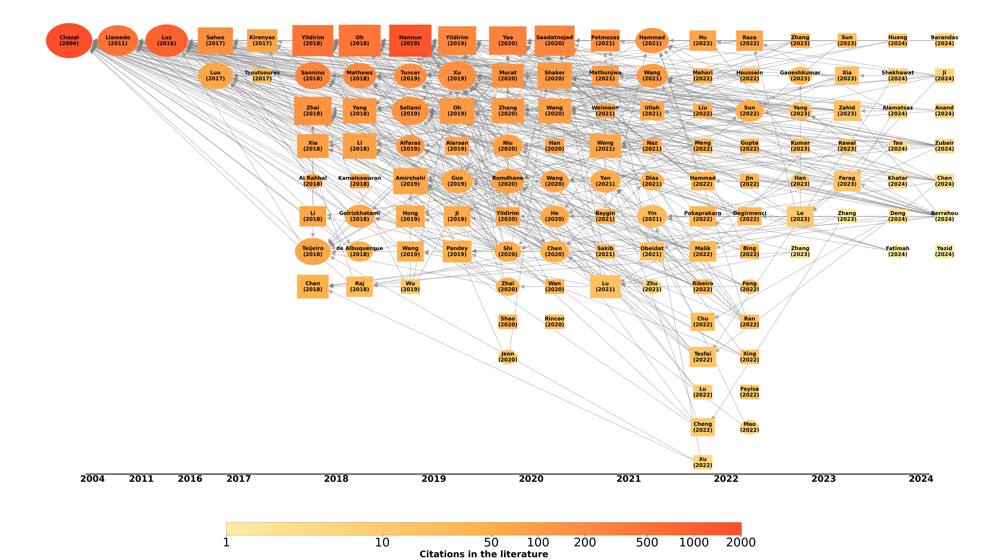

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import matplotlib.patches as patches
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm

# Load adjacency matrix
matriz_adjacencia = pd.read_csv("matriz_adjacencia.csv", index_col=0)

# Load article survey data
file_path = "filename.csv"
article_survey = pd.read_csv(file_path)

# Create dictionaries for node attributes
doi_to_year = dict(zip(article_survey["doi"], article_survey["year"]))
doi_to_chazal = dict(zip(article_survey["doi"], article_survey.get("chazal", "No")))
doi_to_cited = dict(zip(article_survey["doi"], article_survey.get("cited", 0)))
doi_to_author = {
    row["doi"]: row["authors"].split(",")[0] if pd.notna(row["authors"]) else "Unknown"
    for _, row in article_survey.iterrows()
}

# Create a directed graph
G = nx.DiGraph()

# Add nodes with attributes
for doi in matriz_adjacencia.index:
    G.add_node(
        doi,
        year=doi_to_year.get(doi, "Unknown"),
        author=doi_to_author.get(doi, "Unknown"),
        chazal=doi_to_chazal.get(doi, "No"),
        cited=doi_to_cited.get(doi, 0)
    )

# Add edges based on adjacency matrix
for source in matriz_adjacencia.index:
    for target in matriz_adjacencia.columns:
        if int(matriz_adjacencia.loc[source, target]) == 1:
            G.add_edge(source, target)

# Position nodes by year
anos = sorted(set(str(y) for y in doi_to_year.values() if y != "Unknown"))
pos = {}
# Spacing parameters
x_step, y_step, col_offset = 75000, 18000, 36000
year_positions = {}

x_pos = 0
cont = 0
for i, ano in enumerate(anos):
    artigos_do_ano = [n for n, attr in G.nodes(data=True) if str(attr["year"]) == ano]
    if cont < 4:
        x_pos += x_step / 2
    else:
        x_pos += x_step

    year_positions[ano] = x_pos

    for j, artigo in enumerate(artigos_do_ano):
        col = j % 2
        y_pos = -(j // 2) * y_step
        pos[artigo] = (x_pos + (col * col_offset - col_offset // 2), y_pos)
    cont += 1

# Create figure and axis
fig, ax = plt.subplots(figsize=(120, 60))
ax.axis("off")

# Draw timeline
eixo_x_y = min(pos.values(), key=lambda x: x[1])[1] - 6000
ax.plot([min(year_positions.values()) - 5000, max(year_positions.values()) + 5000],
        [eixo_x_y, eixo_x_y], color="black", linewidth=6)
ax.annotate("", xy=(max(year_positions.values()) + 7000, eixo_x_y),
            xytext=(max(year_positions.values()) + 4000, eixo_x_y),
            arrowprops=dict(arrowstyle="->", lw=6, color="black"))

# Add year labels
for ano, x_pos in year_positions.items():
    ax.text(x_pos, eixo_x_y - 400, str(ano), fontsize=60, fontweight="bold", ha="center", va="top", color="black")

# Create node labels
node_labels = {node: f"{attrs['author']}\n({attrs['year']})" for node, attrs in G.nodes(data=True)}

# Compute in-degrees
in_degrees = dict(G.in_degree())
max_in_degree = max(in_degrees.values(), default=1)

# Node size and color setup
node_sizes_dict = {}
min_size, max_size = 14000, 35000

# Custom colormap
cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", ["#FFEDA0", "#FEB24C", "#FC4E2A"])
citacoes = np.array([G.nodes[n]["cited"] for n in G.nodes()], dtype=float)
max_citacoes = max(citacoes) if max(citacoes) > 0 else 1
node_colors = np.log1p(citacoes) / np.log1p(max_citacoes)

# Draw nodes with logarithmic scaling
for node, (x, y) in pos.items():
    texto = node_labels[node]
    cor_no = cmap(node_colors[list(G.nodes()).index(node)])

    # Logarithmic scaling for size based on in-degrees
    fator_escala = np.log1p(in_degrees[node]) / np.log1p(max_in_degree) if max_in_degree > 0 else 0
    largura = min_size + fator_escala * (max_size - min_size)
    altura = largura * 0.5

    node_sizes_dict[node] = (largura / 2, altura / 2)

    shape = (patches.Rectangle((x - largura / 2, y - altura / 2), largura, altura, color=cor_no, edgecolor="black", lw=6, zorder=3)
             if G.nodes[node]["chazal"] == "No" else
             patches.Ellipse((x, y), width=largura, height=altura, color=cor_no, edgecolor="black", lw=6, zorder=3))

    ax.add_patch(shape)
    ax.text(x, y, texto, fontsize=35, fontweight="bold", ha="center", va="center", color="black", zorder=4)

# Draw edges
for u, v in G.edges():
    x_start, y_start = pos[u]
    x_end, y_end = pos[v]
    raio_u_x, raio_u_y = node_sizes_dict[u]
    raio_v_x, raio_v_y = node_sizes_dict[v]

    dx, dy = x_end - x_start, y_end - y_start
    dist = np.sqrt(dx**2 + dy**2) or 1  # Avoid division by zero
    dx, dy = dx / dist, dy / dist

    x_start_new = x_start + dx * (raio_u_x + 300)
    y_start_new = y_start + dy * (raio_u_y + 300)
    x_end_new = x_end - dx * (raio_v_x + 300)
    y_end_new = y_end - dy * (raio_v_y + 300)

    arrow = FancyArrowPatch((x_start_new, y_start_new), (x_end_new, y_end_new),
                            arrowstyle="-|>", mutation_scale=60, color="gray", lw=4, alpha=0.5)
    ax.add_patch(arrow)

# Logarithmic node sizes based on citations (for reference, though not used in drawing)
min_size, max_size = 2000, 10000
node_sizes = min_size + (np.log1p(citacoes) / np.log1p(max_citacoes)) * (max_size - min_size)
# vmin=1 to avoid log(0)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=1, vmax=max_citacoes))

cax = fig.add_axes([0.3, 0.05, 0.4, 0.02]) # [x, y, width, height]
cbar = fig.colorbar(sm, cax=cax, orientation="horizontal")
cbar.set_label("Citations in the literature", fontsize=60, labelpad=10, fontweight="bold")

ticks = [1, 10, 50, 100, 200, 500, 1000, 2000]
cbar.set_ticks(ticks)
cbar.set_ticklabels([str(t) for t in ticks])
cbar.ax.tick_params(labelsize=80, width=3, length=10)

plt.savefig("citation_graph.pdf", dpi=100, bbox_inches="tight")
plt.show()